<h1>Lending Club: Loan Default Prediction</h1>

### Exploratory Data Analysis.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

%matplotlib inline

### List of some important variable names and their meanings. 

df - original dataframe.

initial_features - all the features in original dataframe.

df_c - copy of df containing integer coded bins.

df_c2 - copy of df conatining Interval object bins.

df_c3 - concatenation of categorical features and bins without integer encoding.  

categorical_features - features haivng less than 15 unique values, hence distinguished as categorical. Along with 'id' and our target variable 'loan_repaid'.

non_categorical_features - set subtraction of initial_feratures and categorical_featues. Along with 'id' and our target variable 'loan_repaid'.

cont_features - non_categorical_features without 'id' and 'loan_repaid'.

mi_score_df - dataframe of mutual infromation scores.

final_features - list of features filtered using mutual information score.

final_categorical_features, final_non_categorical_features - categorical, and non categorical feature sets segregated from final_features.


In [2]:
pd.set_option('display.max_columns', 1000)

In [3]:
df = pd.read_csv('cleaned.csv')

In [4]:
df_c = df.copy(deep=True)

In [5]:
# checking if any of the column still contains single value
(df_c.apply(pd.Series.nunique) == 1).value_counts()

False    30
Name: count, dtype: int64

There are no single value features.
___

In [6]:
initial_features = df_c.columns.to_list()

In [7]:
# Creating list of all features with their respective number of unique values, so that we can segregate categorical features from non categorical features.
nunique_list = []

for i in initial_features:
    nunique_list.append(df_c[i].nunique())

nunique_df = pd.DataFrame(nunique_list, index=initial_features, columns=['nunique_count'])
nunique_df.T

,id,loan_amnt,term,int_rate,installment,sub_grade,home_ownership,annual_inc,verification_status,purpose,addr_state,dti,delinq_2yrs,earliest_cr_line,open_acc,pub_rec,revol_bal,revol_util,total_acc,application_type,bc_util,mort_acc,num_actv_rev_tl,num_bc_sats,pct_tl_nvr_dlq,pub_rec_bankruptcies,tax_liens,total_bal_ex_mort,disbursement_method,loan_repaid
nunique_count,1262917,1549,2,356,80067,35,6,61264,3,14,51,7034,31,736,83,37,82592,1271,142,2,1443,7,30,52,630,2,2,177122,2,2


Now we can define a threshold for a feature to be differentiated as categorical feature, and by looking at above unique counts dataframe our threshold value is 15. That is if a feature has more than 15 unique values it can not be considered as categorical feature. 

In [8]:
categorical_features = [col for col in initial_features if df_c[col].nunique() < 15]

In [9]:
non_categorical_features = list(set(df_c.columns.to_list()) - set(categorical_features))
non_categorical_features.append('loan_repaid')

Now converting all the object features to numeric features

In [10]:
num_cols = df.select_dtypes('number').columns.to_list()

In [11]:
other_than_numeric_cols = list(set(df.columns.to_list()) - set(num_cols))

Mapping numerical values to categorical variables.

In [12]:
for colname in other_than_numeric_cols:
    df_c[colname], unique_vals = df_c[colname].factorize()

___
Our dataset is very large hence we will take sample to create pairplot, in order to get general idea of the relationships among the variables.

In [13]:
sample_df = df_c.sample(frac=0.0002)

In [14]:
sample_df.shape

(253, 30)

In [15]:
sample_df['loan_repaid'].value_counts()

loan_repaid
1    210
0     43
Name: count, dtype: int64

### Univariate Analysis

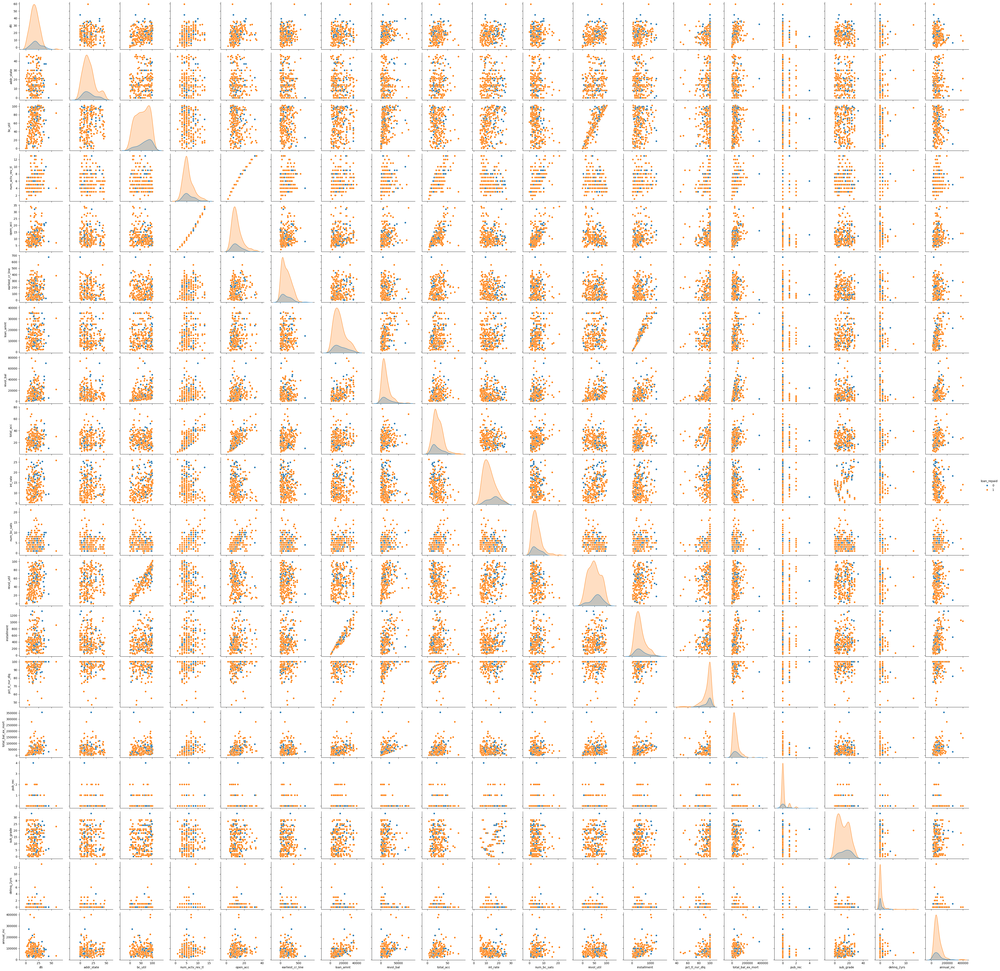

In [16]:
sns.pairplot(sample_df[non_categorical_features].drop(axis=1, columns=['id']), hue='loan_repaid')

Open this plot separately.

from the plot we can see that there are no prominent linear relationships.

To ensure that let's calculate correlation among non_categorical_features.

<Axes: >

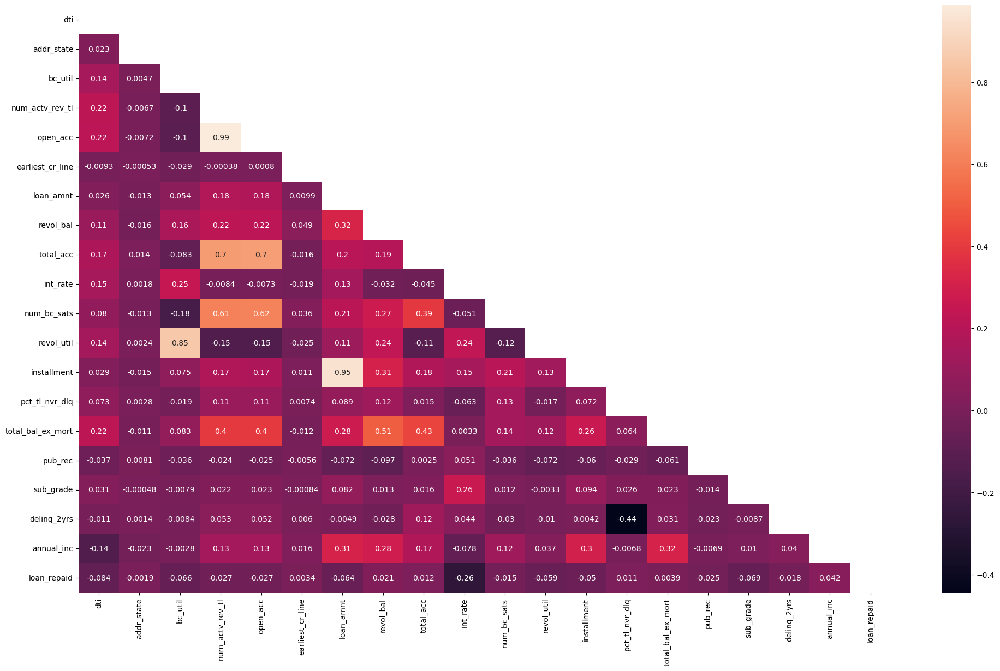

In [17]:
corr_mat = df_c[non_categorical_features].drop(axis=1, columns=['id']).corr()
mask = np.triu(np.ones_like(corr_mat))

plt.figure(figsize=(24, 14))
sns.heatmap(corr_mat, annot=True, mask=mask)

This correlation heatmap ensures that there exists no strong linear relationships with target variable.

We now calculate mutual information score, so that we can quantify relationship of our target variable with categorical valriables.

To calculate mutual information score we require discrete features, discrete feature is not as same as categorical feature, as discrete feature is a numerical feature that has countable values between any two values.

So we can also calculate mutual information score for non categorical features but we have to perform binning to convert them into discrete features. 

In [18]:
def binning(df, feature_name):
    max = df[feature_name].max()
    min = df[feature_name].min()
    iqr = df[feature_name].quantile(q=0.75) - df[feature_name].quantile(q=0.25)
    h = (2*iqr) / df[feature_name].shape[0]**(1/3)
    if(h == 0):
        h = 1
    n_bins = round((max - min) / h)
    if(n_bins < 0):
        n_bins = 1

    new_feature_name = feature_name + '_bins'

    df[new_feature_name] = pd.cut(df[feature_name], n_bins).cat.codes

____
test

In [19]:
df['bc_util'].quantile(q=0.75)

84.8

In [20]:
s = df['bc_util'].sort_values()
i = 75*(s.shape[0] + 1) / 100

i = round(i)
s.reset_index(drop=True, inplace=True)
s.iloc[i]

84.8

___

In [21]:
cont_features = df_c[non_categorical_features].drop(axis=1, columns=['id', 'loan_repaid']).columns

for col in cont_features:
    binning(df_c, col)

mi_features = df_c[categorical_features].columns.to_list()
l = df_c.columns.to_list()

for c in l:
    if('_bins' in c):
        mi_features.append(c)

In [22]:
df_c[mi_features].select_dtypes('float').columns

Index(['pub_rec_bankruptcies', 'tax_liens'], dtype='object')

In [23]:
df_c[['pub_rec_bankruptcies', 'tax_liens']] = df_c[['pub_rec_bankruptcies', 'tax_liens']].astype('int')

In [24]:
from sklearn.feature_selection import mutual_info_classif

X_copy = df_c[mi_features].sample(frac=0.5)
y_copy = X_copy.pop('loan_repaid')
initial_features = X_copy.columns.to_list()

mi_scores = mutual_info_classif(X_copy, y_copy, discrete_features=X_copy.dtypes==int, random_state=42)
mi_scores = pd.Series(mi_scores, index=initial_features)
mi_scores = mi_scores.sort_values(ascending=False)

In [25]:
mi_score_df = pd.DataFrame(mi_scores, columns=['score'])
mi_score_df.T

,sub_grade_bins,verification_status,int_rate_bins,mort_acc,term,pct_tl_nvr_dlq_bins,home_ownership,num_actv_rev_tl_bins,num_bc_sats_bins,purpose,loan_amnt_bins,dti_bins,addr_state_bins,open_acc_bins,installment_bins,bc_util_bins,annual_inc_bins,revol_util_bins,total_acc_bins,earliest_cr_line_bins,total_bal_ex_mort_bins,revol_bal_bins,delinq_2yrs_bins,pub_rec_bins,pub_rec_bankruptcies,tax_liens,disbursement_method,application_type
score,0.042241,0.039124,0.038899,0.035618,0.028343,0.027242,0.026788,0.012612,0.010329,0.010214,0.007718,0.006101,0.005769,0.005401,0.004744,0.0042,0.003549,0.00348,0.002152,0.001352,0.001264,0.001094,0.000847,0.000497,0.000287,0.000076,0.0,0.0


Retaining only the features which have mi_score greater than 0.005

In [26]:
mi_score_df = mi_score_df.loc[mi_score_df['score'] > 0.005]

___
test

In [27]:
my_list = ['apple_bins', 'banana', 'cherry_bins', 'apple_bins', 'banana_bins']
new_list = [x.replace('_bins', '') if '_bins' in x else x for x in my_list]

In [28]:
new_list

['apple', 'banana', 'cherry', 'apple', 'banana']

___

In [29]:
final_features = mi_score_df.T.columns
final_features = [x.replace('_bins', '') if '_bins' in x else x for x in final_features]

In [30]:
print(final_features)

['sub_grade', 'verification_status', 'int_rate', 'mort_acc', 'term', 'pct_tl_nvr_dlq', 'home_ownership', 'num_actv_rev_tl', 'num_bc_sats', 'purpose', 'loan_amnt', 'dti', 'addr_state', 'open_acc']


In [31]:
final_features.append('id')
final_features.append('loan_repaid')
df_c[final_features].head()

,sub_grade,verification_status,int_rate,mort_acc,term,pct_tl_nvr_dlq,home_ownership,num_actv_rev_tl,num_bc_sats,purpose,loan_amnt,dti,addr_state,open_acc,id,loan_repaid
0,0,0,13.99,1,0,76.9,0,4,2.0,0,3600.0,5.91,0,7.0,68407277,1
1,1,0,11.99,3,0,97.4,0,10,13.0,1,24700.0,16.06,1,22.0,68355089,1
2,2,0,10.78,1,1,100.0,0,3,2.0,2,20000.0,10.78,2,6.0,68341763,1
3,3,1,22.45,2,1,96.6,0,6,5.0,3,10400.0,25.37,0,12.0,68476807,1
4,4,1,13.44,0,0,100.0,1,3,2.0,0,11950.0,10.20,3,5.0,68426831,1


___

We have performed binning but to pass those features to mutual information score calculator we have to assign unique numerical codes to bins, that is converting bins from object data type to numerical data type. But those numerical codes are unintelligible for us while performing univariate analysis hence we will create a new dataframe in which those bins will be represented using strings.

In [32]:
pd.DataFrame(df_c.dtypes).T

,id,loan_amnt,term,int_rate,installment,sub_grade,home_ownership,annual_inc,verification_status,purpose,addr_state,dti,delinq_2yrs,earliest_cr_line,open_acc,pub_rec,revol_bal,revol_util,total_acc,application_type,bc_util,mort_acc,num_actv_rev_tl,num_bc_sats,pct_tl_nvr_dlq,pub_rec_bankruptcies,tax_liens,total_bal_ex_mort,disbursement_method,loan_repaid,dti_bins,addr_state_bins,bc_util_bins,num_actv_rev_tl_bins,open_acc_bins,earliest_cr_line_bins,loan_amnt_bins,revol_bal_bins,total_acc_bins,int_rate_bins,num_bc_sats_bins,revol_util_bins,installment_bins,pct_tl_nvr_dlq_bins,total_bal_ex_mort_bins,pub_rec_bins,sub_grade_bins,delinq_2yrs_bins,annual_inc_bins
0,int64,float64,int64,float64,float64,int64,int64,float64,int64,int64,int64,float64,float64,int64,float64,float64,float64,float64,float64,int64,float64,int64,int64,float64,float64,int32,int32,float64,int64,int64,int16,int16,int16,int16,int16,int16,int16,int16,int16,int16,int16,int16,int16,int16,int16,int8,int16,int8,int16


In [33]:
df_c2 = df.copy(deep=True)

In [34]:
for colname in other_than_numeric_cols:
    df_c2[colname], unique_vals = df_c2[colname].factorize()

In [35]:
def binning(df, feature_name):
    max = df[feature_name].max()
    min = df[feature_name].min()
    iqr = df[feature_name].quantile(q=0.75) - df[feature_name].quantile(q=0.25)
    h = round((2*iqr) / df[feature_name].shape[0]**(1/3))
    if(h == 0):
        h = 1
    n_bins = round((max - min) / h)
    if(n_bins < 0):
        n_bins = 1

    new_feature_name = feature_name + '_bins'

    df[new_feature_name] = pd.cut(df[feature_name], n_bins)             # .cat.codes removed
    # df[new_feature_name].astype('interval')

In [36]:
for col in cont_features:
    binning(df_c2, col)

In [37]:
df_c2.head()

,id,loan_amnt,term,int_rate,installment,sub_grade,home_ownership,annual_inc,verification_status,purpose,addr_state,dti,delinq_2yrs,earliest_cr_line,open_acc,pub_rec,revol_bal,revol_util,total_acc,application_type,bc_util,mort_acc,num_actv_rev_tl,num_bc_sats,pct_tl_nvr_dlq,pub_rec_bankruptcies,tax_liens,total_bal_ex_mort,disbursement_method,loan_repaid,dti_bins,addr_state_bins,bc_util_bins,num_actv_rev_tl_bins,open_acc_bins,earliest_cr_line_bins,loan_amnt_bins,revol_bal_bins,total_acc_bins,int_rate_bins,num_bc_sats_bins,revol_util_bins,installment_bins,pct_tl_nvr_dlq_bins,total_bal_ex_mort_bins,pub_rec_bins,sub_grade_bins,delinq_2yrs_bins,annual_inc_bins
0,68407277,3600.0,0,13.99,123.03,0,0,55000.0,0,0,0,5.91,0.0,0,7.0,0.0,2765.0,29.7,13.0,0,37.2,1,4,2.0,76.9,0.0,0.0,7746.0,0,1,"(5.0, 6.0]","(-0.05, 1.0]","(36.956, 37.955]","(3.0, 4.0]","(6.0, 7.0]","(-0.735, 3.0]","(3437.5, 3659.091]","(2569.969, 2826.966]","(12.0, 13.0]","(13.212, 14.199]","(1.0, 2.0]","(28.968, 29.967]","(118.857, 124.853]","(76.0, 77.0]","(7740.393, 8514.432]","(-0.086, 1.0]","(-0.034, 1.0]","(-0.039, 1.0]","(54995.26, 55828.279]"
1,68355089,24700.0,0,11.99,820.28,1,0,65000.0,0,1,1,16.06,1.0,1,22.0,0.0,21470.0,19.2,38.0,0,27.1,3,10,13.0,97.4,0.0,0.0,39475.0,0,1,"(16.0, 17.0]","(-0.05, 1.0]","(26.968, 27.967]","(9.0, 10.0]","(21.0, 22.0]","(-0.735, 3.0]","(24488.636, 24710.227]","(21330.743, 21587.74]","(37.0, 38.0]","(11.236, 12.224]","(12.0, 13.0]","(18.979, 19.978]","(814.411, 820.407]","(97.0, 98.0]","(38701.965, 39476.004]","(-0.086, 1.0]","(-0.034, 1.0]","(-0.039, 1.0]","(64991.489, 65824.508]"
2,68341763,20000.0,1,10.78,432.66,2,0,63000.0,0,2,2,10.78,0.0,2,6.0,0.0,7869.0,56.2,18.0,1,55.9,1,3,2.0,100.0,0.0,0.0,18696.0,0,1,"(10.0, 11.0]","(1.0, 2.0]","(54.935, 55.934]","(2.0, 3.0]","(5.0, 6.0]","(-0.735, 3.0]","(19835.227, 20056.818]","(7709.907, 7966.904]","(17.0, 18.0]","(10.248, 11.236]","(1.0, 2.0]","(55.939, 56.938]","(430.657, 436.653]","(99.0, 100.0]","(18576.943, 19350.982]","(-0.086, 1.0]","(1.0, 2.0]","(-0.039, 1.0]","(62492.431, 63325.45]"
3,68476807,10400.0,1,22.45,289.91,3,0,104433.0,1,3,0,25.37,1.0,3,12.0,0.0,21929.0,64.5,35.0,0,77.5,2,6,5.0,96.6,0.0,0.0,95768.0,0,1,"(25.0, 26.0]","(-0.05, 1.0]","(76.909, 77.908]","(5.0, 6.0]","(11.0, 12.0]","(-0.735, 3.0]","(10306.818, 10528.409]","(21844.737, 22101.734]","(34.0, 35.0]","(22.101, 23.088]","(4.0, 5.0]","(63.93, 64.929]","(286.749, 292.745]","(96.0, 97.0]","(95206.833, 95980.872]","(-0.086, 1.0]","(2.0, 3.0]","(-0.039, 1.0]","(104143.386, 104976.405]"
4,68426831,11950.0,0,13.44,405.18,4,1,34000.0,1,0,3,10.20,0.0,4,5.0,0.0,8822.0,68.4,6.0,0,91.0,0,3,2.0,100.0,0.0,0.0,12798.0,0,1,"(10.0, 11.0]","(2.0, 3.0]","(90.893, 91.892]","(2.0, 3.0]","(4.0, 5.0]","(3.0, 6.0]","(11857.955, 12079.545]","(8737.895, 8994.892]","(5.0, 6.0]","(13.212, 14.199]","(1.0, 2.0]","(67.926, 68.925]","(400.676, 406.672]","(99.0, 100.0]","(12384.629, 13158.668]","(-0.086, 1.0]","(3.0, 4.0]","(-0.039, 1.0]","(33336.763, 34169.782]"


Now we can use df_c2 to for our further exploration of final features
____



['sub_grade', 'verification_status', 'int_rate', 'mort_acc', 'term', 'pct_tl_nvr_dlq', 'home_ownership', 'num_actv_rev_tl', 'num_bc_sats', 'purpose', 'dti', 'loan_amnt', 'addr_state', 'open_acc']

In [38]:
final_categorical_features = list(set(final_features).intersection(set(categorical_features)))

In [39]:
final_categorical_features

['mort_acc',
 'verification_status',
 'term',
 'loan_repaid',
 'purpose',
 'home_ownership']

In [40]:
final_non_categorical_features = list(set(final_features) - set(final_categorical_features))
final_non_categorical_features

['pct_tl_nvr_dlq',
 'dti',
 'num_actv_rev_tl',
 'id',
 'addr_state',
 'open_acc',
 'sub_grade',
 'int_rate',
 'num_bc_sats',
 'loan_amnt']

'sub_grade' and 'addr_state' are actually categorical features but our filter missed them.

In [41]:
final_non_categorical_features.remove('sub_grade')
final_non_categorical_features.remove('addr_state')
final_categorical_features.append('sub_grade')
final_categorical_features.append('addr_state')

___
### Non categorical features
#### 'loan_amnt'

In [42]:
df_c2['loan_amnt'].describe()

count    1.262917e+06
mean     1.457927e+04
std      8.740204e+03
min      1.000000e+03
25%      8.000000e+03
50%      1.200000e+04
75%      2.000000e+04
max      4.000000e+04
Name: loan_amnt, dtype: float64

C:\Users\sudhn\AppData\Local\Temp\ipykernel_18052\2191269243.py:3: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  g.set_xticklabels(g.get_xticklabels(), rotation=90)


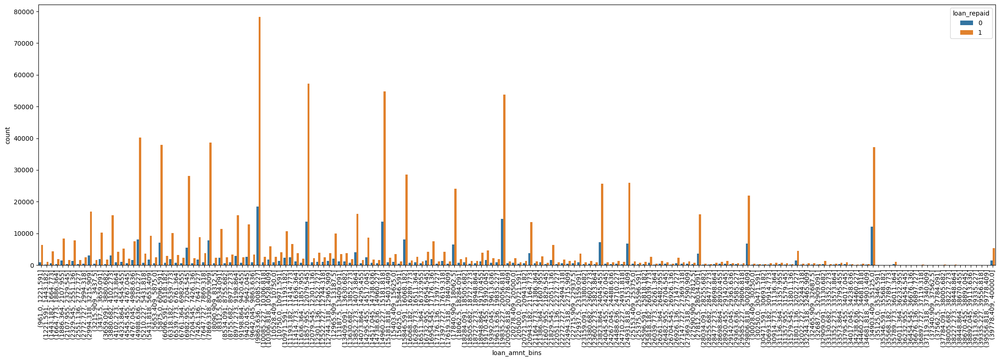

In [43]:
plt.figure(figsize=(22, 8))
g = sns.countplot(data=df_c2, x='loan_amnt_bins', hue='loan_repaid')
g.set_xticklabels(g.get_xticklabels(), rotation=90)
plt.tight_layout()
warnings.simplefilter('once')

we have to check whether the ratio of charged off / fully paid is similar across all income intervals or they show any different trend.

In [44]:
co_vs_fp = pd.DataFrame(df_c2.groupby(by='loan_amnt_bins')['loan_repaid'].value_counts())
co_vs_fp = co_vs_fp.unstack()
co_vs_fp['per_co_to_fp'] = co_vs_fp['count', 0] / co_vs_fp['count', 1]
co_vs_fp['per_co_to_fp'].describe()

C:\Users\sudhn\AppData\Local\Temp\ipykernel_18052\967170618.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  co_vs_fp = pd.DataFrame(df_c2.groupby(by='loan_amnt_bins')['loan_repaid'].value_counts())


count    176.000000
mean       0.306637
std        0.094352
min        0.076923
25%        0.229865
50%        0.305231
75%        0.385647
max        0.530822
Name: per_co_to_fp, dtype: float64

C:\Users\sudhn\AppData\Local\Temp\ipykernel_18052\1960265480.py:5: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  g.set_xticklabels(g.get_xticklabels(), rotation=90)


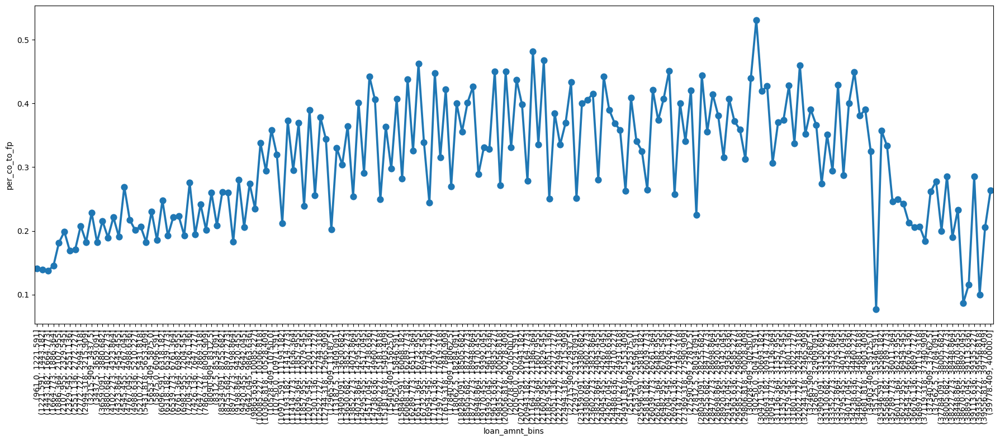

In [45]:
# plot for percentage of charged off / fully paid across all loan_amnt_bins 

plt.figure(figsize=(18, 8))
g = sns.pointplot(co_vs_fp['per_co_to_fp'])
g.set_xticklabels(g.get_xticklabels(), rotation=90)
plt.tight_layout()
warnings.simplefilter('once')

From the plot a hike in percentage of charged off cases can be seen in amount interval (8479, 35191)

___
#### 'int_rate'

C:\Users\sudhn\AppData\Local\Temp\ipykernel_18052\3337165743.py:3: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  g.set_xticklabels(g.get_xticklabels(), rotation=90)


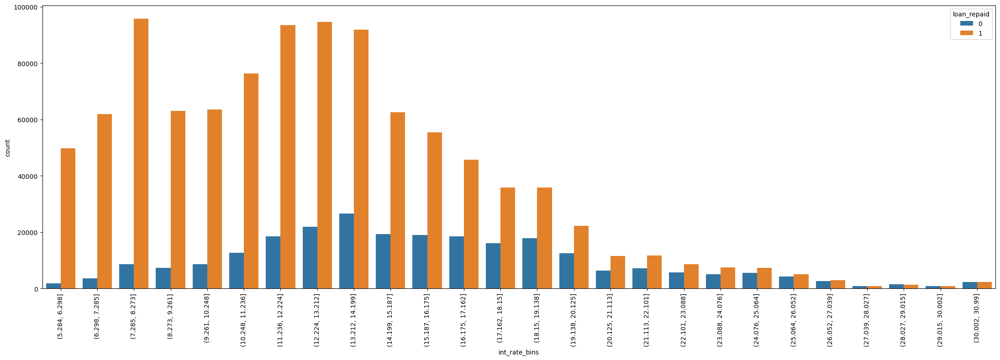

In [46]:
plt.figure(figsize=(22, 8))
g = sns.countplot(data=df_c2, x='int_rate_bins', hue='loan_repaid')
g.set_xticklabels(g.get_xticklabels(), rotation=90)
plt.tight_layout()
warnings.simplefilter('once')

It can be observed that most of the loans provided with low interest rates have least chances of being default, and most of the loans are approved for interest rates between (5, 14).

In [47]:
co_vs_fp = pd.DataFrame(df_c2.groupby(by='int_rate_bins')['loan_repaid'].value_counts())
co_vs_fp = co_vs_fp.unstack()
co_vs_fp['per_co_to_fp'] = co_vs_fp['count', 0] / co_vs_fp['count', 1]
co_vs_fp['per_co_to_fp'].describe()

C:\Users\sudhn\AppData\Local\Temp\ipykernel_18052\2440856452.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  co_vs_fp = pd.DataFrame(df_c2.groupby(by='int_rate_bins')['loan_repaid'].value_counts())


count    26.000000
mean      0.495463
std       0.327478
min       0.035431
25%       0.205971
50%       0.474287
75%       0.732594
max       1.037911
Name: per_co_to_fp, dtype: float64

C:\Users\sudhn\AppData\Local\Temp\ipykernel_18052\4055602717.py:3: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  g.set_xticklabels(g.get_xticklabels(), rotation=90)


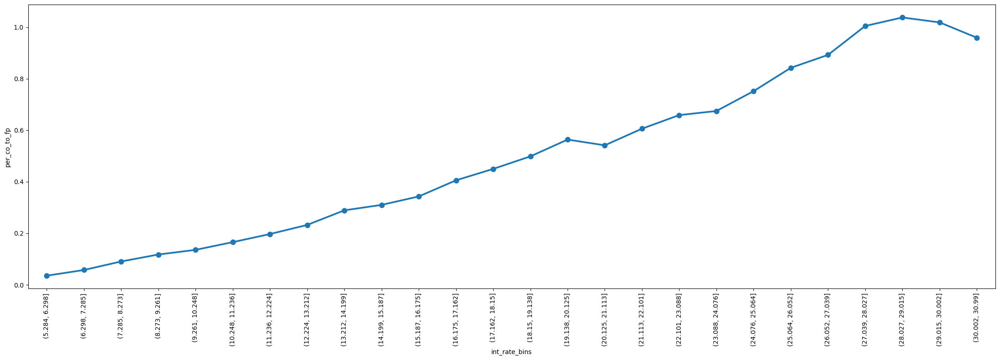

In [48]:
plt.figure(figsize=(22, 8))
g = sns.pointplot(co_vs_fp['per_co_to_fp'])
g.set_xticklabels(g.get_xticklabels(), rotation=90)
plt.tight_layout()
warnings.simplefilter('once')

From the plot it is clear that as interest rate increases chances of borrower will default increases.
___
#### 'installment'

C:\Users\sudhn\AppData\Local\Temp\ipykernel_18052\689396557.py:4: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  g.set_xticklabels(g.get_xticklabels(), rotation=90)


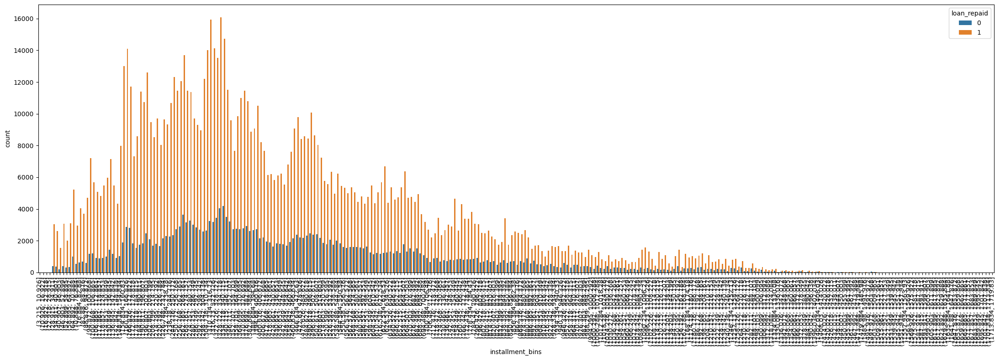

In [49]:
# plot for number of loans VS installment_bins
plt.figure(figsize=(22, 8))
g = sns.countplot(data=df_c2, x='installment_bins', hue='loan_repaid')
g.set_xticklabels(g.get_xticklabels(), rotation=90)
plt.tight_layout()
warnings.simplefilter('once')

The distribution is skewed on the left side, and it can be observed that as installment increases number of loans decreases, also the ratio of charged off / fully paid also increases. For most of the installment bins this ratio seems to be equal.

To see it in more detail we plot charged off / fully paid point plot.

In [50]:
co_vs_fp = pd.DataFrame(df_c2.groupby(by='installment_bins')['loan_repaid'].value_counts())
co_vs_fp = co_vs_fp.unstack()
co_vs_fp['per_co_to_fp'] = co_vs_fp['count', 0] / co_vs_fp['count', 1]
co_vs_fp['per_co_to_fp'].describe()

C:\Users\sudhn\AppData\Local\Temp\ipykernel_18052\4226453010.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  co_vs_fp = pd.DataFrame(df_c2.groupby(by='installment_bins')['loan_repaid'].value_counts())


count    266.000000
mean       0.321823
std        0.227649
min        0.000000
25%        0.222441
50%        0.286521
75%        0.335601
max        2.000000
Name: per_co_to_fp, dtype: float64

C:\Users\sudhn\AppData\Local\Temp\ipykernel_18052\4055602717.py:3: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  g.set_xticklabels(g.get_xticklabels(), rotation=90)


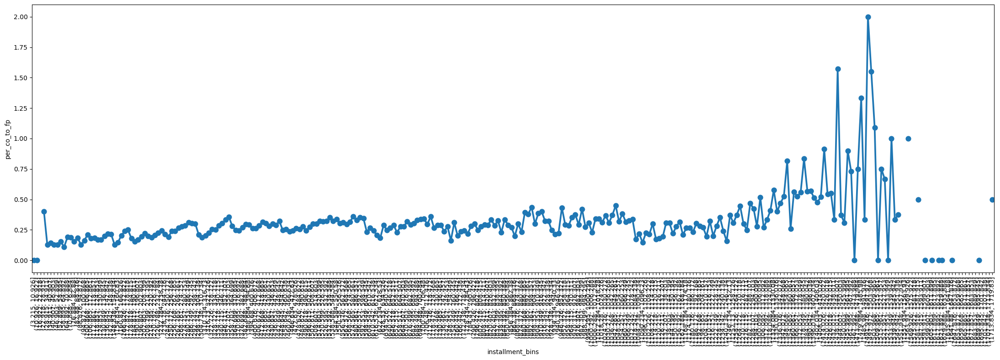

In [51]:
plt.figure(figsize=(22, 8))
g = sns.pointplot(co_vs_fp['per_co_to_fp'])
g.set_xticklabels(g.get_xticklabels(), rotation=90)
plt.tight_layout()
warnings.simplefilter('once')

This plot ensures that the ratio of charged off / fully paid increses as the installment increases.
___
#### 'open_acc'
- Number of open credit lines in borrower's credit file.

C:\Users\sudhn\AppData\Local\Temp\ipykernel_18052\3095965594.py:4: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  g.set_xticklabels(g.get_xticklabels(), rotation=90)


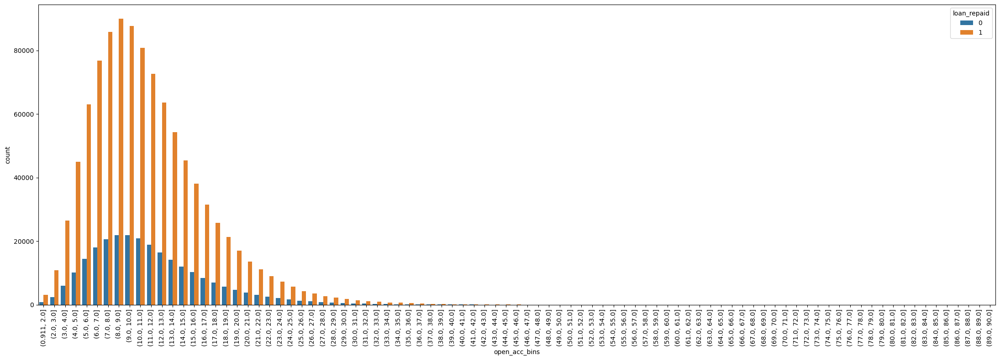

In [52]:
# plot for number of loans VS open_acc_bins
plt.figure(figsize=(22, 8))
g = sns.countplot(data=df_c2, x='open_acc_bins', hue='loan_repaid')
g.set_xticklabels(g.get_xticklabels(), rotation=90)
plt.tight_layout()
warnings.simplefilter('once')

From the plot it can be easily observed that most of the borrowers have 5 to 15 credit lines. 
___
#### 'num_actv_rev_tl'
- Number of currently active revolving trades.

C:\Users\sudhn\AppData\Local\Temp\ipykernel_18052\2675258303.py:4: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  g.set_xticklabels(g.get_xticklabels(), rotation=90)


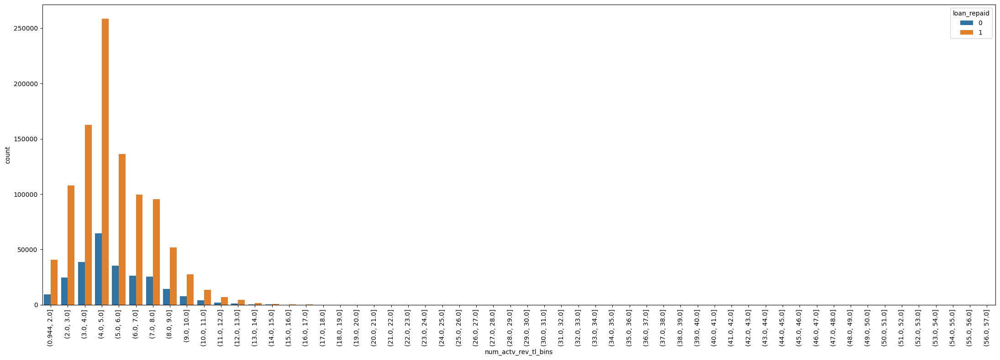

In [53]:
# plot for number of loans VS num_actv_rev_tl_bins
plt.figure(figsize=(22, 8))
g = sns.countplot(data=df_c2, x='num_actv_rev_tl_bins', hue='loan_repaid')
g.set_xticklabels(g.get_xticklabels(), rotation=90)
plt.tight_layout()
warnings.simplefilter('once')

From the plot we can see that most of the borrowers have 1 to 10 active revolving trades.

Charged off / fully paid ratio also seems quite similar across bins (1, 10).

In [54]:
co_vs_fp = pd.DataFrame(df_c2.groupby(by='num_actv_rev_tl_bins')['loan_repaid'].value_counts())
co_vs_fp = co_vs_fp.unstack()
co_vs_fp.T

C:\Users\sudhn\AppData\Local\Temp\ipykernel_18052\3971264275.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  co_vs_fp = pd.DataFrame(df_c2.groupby(by='num_actv_rev_tl_bins')['loan_repaid'].value_counts())


num_actv_rev_tl_bins  (0.944, 2.0]  (2.0, 3.0]  (3.0, 4.0]  (4.0, 5.0]  \
      loan_repaid                                                        
count 0                       9261       24611       38670       64728   
      1                      40570      107918      162532      258466   

num_actv_rev_tl_bins  (5.0, 6.0]  (6.0, 7.0]  (7.0, 8.0]  (8.0, 9.0]  \
      loan_repaid                                                      
count 0                    35371       26187       25666       14240   
      1                   136177       99706       95295       52032   

num_actv_rev_tl_bins  (9.0, 10.0]  (10.0, 11.0]  (11.0, 12.0]  (12.0, 13.0]  \
      loan_repaid                                                             
count 0                      7805          4095          2107          1336   
      1                     27408         13551          6747          4271   

num_actv_rev_tl_bins  (13.0, 14.0]  (14.0, 15.0]  (15.0, 16.0]  (16.0, 17.0]  \
      loan_repaid                                                              
count 0                        524           237            59           122   
      1                       1761           676           173           296   

num_actv_rev_tl_bins  (17.0, 18.0]  (18.0, 19.0]  (19.0, 20.0]  (20.0, 21.0]  \
      loan_repaid                                                              
count 0                         28            13            12            15   
      1                         87            36            36            25   

num_actv_rev_tl_bins  (21.0, 22.0]  (22.0, 23.0]  (23.0, 24.0]  (24.0, 25.0]  \
      loan_repaid                                                              
count 0                          0            13             0             0   
      1                          1            32             0             1   

num_actv_rev_tl_bins  (25.0, 26.0]  (26.0, 27.0]  (27.0, 28.0]  (28.0, 29.0]  \
      loan_repaid                                                              
count 0                          4             0             0             0   
      1                          7             0             0             0   

num_actv_rev_tl_bins  (29.0, 30.0]  (30.0, 31.0]  (31.0, 32.0]  (32.0, 33.0]  \
      loan_repaid                                                              
count 0                          0             0             0             0   
      1                          0             0             0             0   

num_actv_rev_tl_bins  (33.0, 34.0]  (34.0, 35.0]  (35.0, 36.0]  (36.0, 37.0]  \
      loan_repaid                                                              
count 0                          0             0             1             1   
      1                          0             0             2             0   

num_actv_rev_tl_bins  (37.0, 38.0]  (38.0, 39.0]  (39.0, 40.0]  (40.0, 41.0]  \
      loan_repaid                                                              
count 0                          0             0             0             0   
      1                          0             0             0             0   

num_actv_rev_tl_bins  (41.0, 42.0]  (42.0, 43.0]  (43.0, 44.0]  (44.0, 45.0]  \
      loan_repaid                                                              
count 0                          0             0             0             0   
      1                          2             0             0             0   

num_actv_rev_tl_bins  (45.0, 46.0]  (46.0, 47.0]  (47.0, 48.0]  (48.0, 49.0]  \
      loan_repaid                                                              
count 0                          0             0             0             0   
      1                          0             0             2             0   

num_actv_rev_tl_bins  (49.0, 50.0]  (50.0, 51.0]  (51.0, 52.0]  (52.0, 53.0]  \
      loan_repaid                                                              
count 0                          0             0

But from the above dataframe we can also see that for very high number of active trades the cases of charged off are zero.
___
#### 'num_bc_sats'
- Number of satisfactory bankcard accounts.

C:\Users\sudhn\AppData\Local\Temp\ipykernel_18052\2422739836.py:3: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  g.set_xticklabels(g.get_xticklabels(), rotation=90)


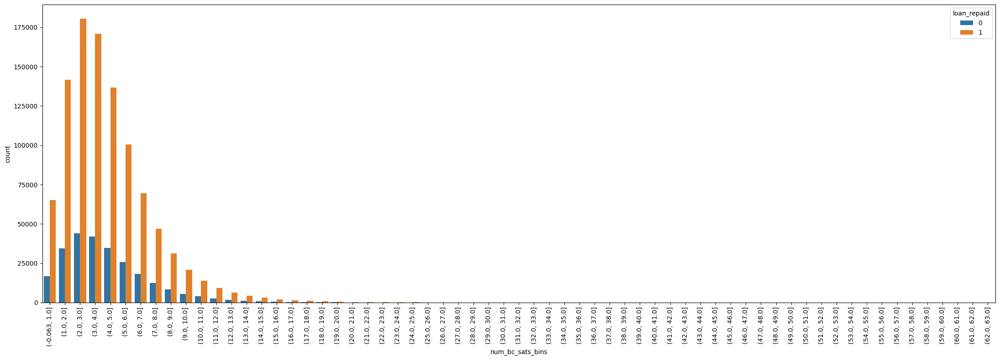

In [55]:
plt.figure(figsize=(22, 8))
g = sns.countplot(data=df_c2, x='num_bc_sats_bins', hue='loan_repaid')
g.set_xticklabels(g.get_xticklabels(), rotation=90)
plt.tight_layout()
warnings.simplefilter('once')

From the plot we can see that most of the borrowers have 2 to 6 satisfactory bankcard accounts.

Charged off / fully paid ratio also seems quite similar across bin (1, 10).

In [56]:
co_vs_fp = pd.DataFrame(df_c2.groupby(by='num_bc_sats_bins')['loan_repaid'].value_counts())
co_vs_fp = co_vs_fp.unstack()
co_vs_fp['per_co_to_fp'] = co_vs_fp['count', 0] / co_vs_fp['count', 1]
co_vs_fp.T

C:\Users\sudhn\AppData\Local\Temp\ipykernel_18052\3538493905.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  co_vs_fp = pd.DataFrame(df_c2.groupby(by='num_bc_sats_bins')['loan_repaid'].value_counts())


num_bc_sats_bins          (-0.063, 1.0]     (1.0, 2.0]     (2.0, 3.0]  \
             loan_repaid                                                
count        0             16728.000000   34350.000000   43932.000000   
             1             65234.000000  141629.000000  180386.000000   
per_co_to_fp                   0.256431       0.242535       0.243544   

num_bc_sats_bins             (3.0, 4.0]     (4.0, 5.0]     (5.0, 6.0]  \
             loan_repaid                                                
count        0             42092.000000   34758.000000   25815.000000   
             1            170756.000000  136571.000000  100622.000000   
per_co_to_fp                   0.246504       0.254505       0.256554   

num_bc_sats_bins            (6.0, 7.0]    (7.0, 8.0]    (8.0, 9.0]  \
             loan_repaid                                             
count        0            18210.000000  12475.000000   8482.000000   
             1            69449.000000  46846.000000  31215.000000   
per_co_to_fp                  0.262207      0.266298      0.271728   

num_bc_sats_bins           (9.0, 10.0]  (10.0, 11.0]  (11.0, 12.0]  \
             loan_repaid                                             
count        0             5631.000000   4005.000000   2618.000000   
             1            20814.000000  13896.000000   9323.000000   
per_co_to_fp                  0.270539      0.288212      0.280811   

num_bc_sats_bins          (12.0, 13.0]  (13.0, 14.0]  (14.0, 15.0]  \
             loan_repaid                                             
count        0             1809.000000   1188.000000    845.000000   
             1             6223.000000   4294.000000   3078.000000   
per_co_to_fp                  0.290696      0.276665      0.274529   

num_bc_sats_bins          (15.0, 16.0]  (16.0, 17.0]  (17.0, 18.0]  \
             loan_repaid                                             
count        0              603.000000     405.00000    308.000000   
             1             2016.000000    1442.00000   1058.000000   
per_co_to_fp                  0.299107       0.28086      0.291115   

num_bc_sats_bins          (18.0, 19.0]  (19.0, 20.0]  (20.0, 21.0]  \
             loan_repaid                                             
count        0              210.000000    152.000000    114.000000   
             1              727.000000    520.000000    390.000000   
per_co_to_fp                  0.288858      0.292308      0.292308   

num_bc_sats_bins          (21.0, 22.0]  (22.0, 23.0]  (23.0, 24.0]  \
             loan_repaid                                             
count        0               93.000000     62.000000     57.000000   
             1              330.000000    220.000000    178.000000   
per_co_to_fp                  0.281818      0.281818      0.320225   

num_bc_sats_bins          (24.0, 25.0]  (25.0, 26.0]  (26.0, 27.0]  \
             loan_repaid                                             
count        0               36.000000     30.000000     23.000000   
             1              146.000000     88.000000     77.000000   
per_co_to_fp                  0.246575      0.340909      0.298701   

num_bc_sats_bins          (27.0, 28.0]  (28.0, 29.0]  (29.0, 30.0]  \
             loan_repaid                                             
count        0               17.000000     13.000000         9.000   
             1               53.000000     46.000000        40.000   
per_co_to_fp                  0.320755      0.282609         0.225   

num_bc_sats_bins          (30.0, 31.0]  (31.0, 32.0]  (32.0, 33.0]  \
             loan_repaid                                             
count        0                5.000000          7.00      3.000000   
             1               29.000000         28.00     18.000000   
per_co_to_fp                  0.172414          0.25      0.166667   

num_bc_sats_bins          (33.0, 34.0]  (34.0, 35.0]  (35.0, 36.0]  \
             loan_repaid               

This ensure our prediction that charged off / fully paid ratio is quite similar across bins (0.69, 1] to (9, 10].

But for very high number of satisfactory bankcards  the cases of charged off are zero.
___
#### 'dti'
- debt-to-income ratio

C:\Users\sudhn\AppData\Local\Temp\ipykernel_18052\421549794.py:3: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  g.set_xticklabels(g.get_xticklabels(), rotation=90)


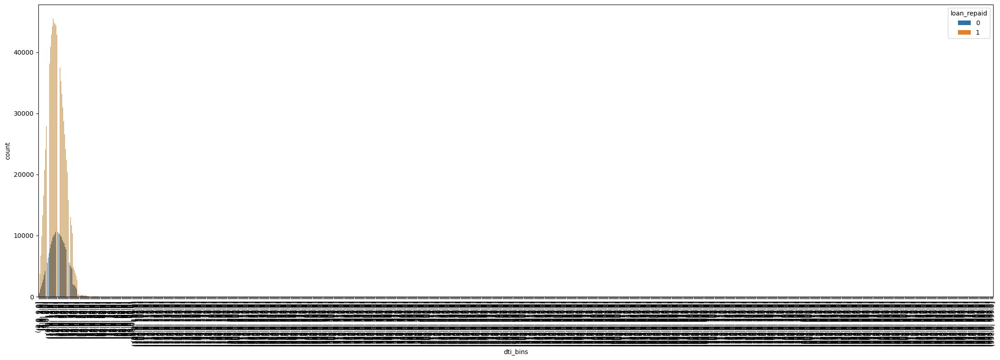

In [57]:
plt.figure(figsize=(22, 8))
g = sns.countplot(data=df_c2, x='dti_bins', hue='loan_repaid')
g.set_xticklabels(g.get_xticklabels(), rotation=90)
plt.tight_layout()
warnings.simplefilter('once')

There are too many bins with zero value, dropping, or if the bins are consecutive, concatenating them together and creating one large single bin for them will give us clear plot

In [58]:
count_df = pd.DataFrame(df_c2['dti_bins'].value_counts().sort_index())
count_df['dti_bins'] = count_df.index
count_df.reset_index(drop=True, inplace=True)
count_df.T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999
count,557,4453,8018,11636,15620,19379,24370,28264,32833,37000,41169,45244,48753,51442,53289,55190,54818,54790

From this dataframe we can see that the count gradually increases and also gradually decreases, from (92.0, 93.0] there are no instances of count greater than 15 hence we will group these bins together and make it as a new large bin.

In [59]:
# merging bins
i = 93
bin_mappings = {}

while(i < count_df.shape[0]):
    l = []
    if(count_df.iloc[i]['count'] <= 15):
        left = count_df.iloc[i]['dti_bins'].left
        l.append(count_df.iloc[i]['dti_bins'])
        i = i + 1
    else:
        i = i + 1
        continue

    while(count_df.iloc[i]['count'] <= 15):
        l.append(count_df.iloc[i]['dti_bins'])
        i = i + 1
    else:
        right = count_df.iloc[i]['dti_bins'].left
        new_interval = pd.Interval(left=left, right=right)
        l = tuple(l)
        bin_mappings[l] = new_interval
        i = i + 1

In [60]:
df_c2['dti_bins'] = df_c2['dti_bins'].replace(bin_mappings)

C:\Users\sudhn\AppData\Local\Temp\ipykernel_18052\2436284434.py:1: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  df_c2['dti_bins'] = df_c2['dti_bins'].replace(bin_mappings)


In [61]:
pd.DataFrame(df_c2['dti_bins'].value_counts().sort_index()).T

dti_bins,"(-2.0, 0.0]","(0.0, 1.0]","(1.0, 2.0]","(2.0, 3.0]","(3.0, 4.0]","(4.0, 5.0]","(5.0, 6.0]","(6.0, 7.0]","(7.0, 8.0]","(8.0, 9.0]","(9.0, 10.0]","(10.0, 11.0]","(11.0, 12.0]","(12.0, 13.0]","(13.0, 14.0]","(14.0, 15.0]","(15.0, 16.0]","(16.0, 17.0]","(17.0, 18.0]","(18.0, 19.0]","(19.0, 20.0]","(20.0, 21.0]","(21.0, 22.0]","(22.0, 23.0]","(23.0, 24.0]","(24.0, 25.0]","(25.0, 26.0]","(26.0, 27.0]","(27.0, 28.0]","(28.0, 29.0]","(29.0, 30.0]","(30.0, 31.0]","(31.0, 32.0]","(32.0, 33.0]","(33.0, 34.0]","(34.0, 35.0]","(35.0, 36.0]","(36.0, 37.0]","(37.0, 38.0]","(38.0, 39.0]","(39.0, 40.0]","(40.0, 41.0]","(41.0, 42.0]","(42.0, 43.0]","(43.0, 44.0]","(44.0, 45.0]","(45.0, 46.0]","(46.0, 47.0]","(47.0, 48.0]","(48.0, 49.0]","(49.0, 50.0]","(50.0, 51.0]","(51.0, 52.0]","(52.0, 53.0]","(53.0, 54.0]","(54.0, 55.0]","(55.0, 56.0]","(56.0, 57.0]","(57.0, 58.0]","(58.0, 59.0]","(59.0, 60.0]","(60.0, 61.0]","(61.0, 62.0]","(62.0, 63.0]","(63.0, 64.0]","(64.0, 65.0]","(65.0, 66.0]","(66.0, 67.0]","(67.0, 68.0]","(68.0, 69.0]","(69.0, 70.0]","(70.0, 71.0]","(71.0, 72.0]","(72.0, 73.0]","(73.0, 74.0]","(74.0, 75.0]","(75.0, 76.0]","(76.0, 77.0]","(77.0, 78.0]","(78.0, 79.0]","(79.0, 80.0]","(80.0, 81.0]","(81.0, 82.0]","(82.0, 83.0]","(83.0, 84.0]","(84.0, 85.0]","(85.0, 86.0]","(86.0, 87.0]","(87.0, 88.0]","(88.0, 89.0]","(89.0, 90.0]","(90.0, 91.0]","(91.0, 92.0]","(92.0, 998.0]","(998.0, 999.0]"
count,557,4453,8018,11636,15620,19379,24370,28264,32833,37000,41169,45244,48753,51442,53289,55190,54818,54790,54914,53391,52382,50039,47733,45245,42943,40252,37673,35245,32345,30116,27667,21894,20147,18203,16542,14870,6852,6278,5638,5048,4013,562,498,477,432,436,385,334,275,298,247,146,123,115,94,99,111,93,80,97,85,64,74,59,47,50,60,49,45,45,47,39,29,36,31,27,40,26,26,34,24,18,29,23,23,18,9,16,17,13,15,7,16,581,38


C:\Users\sudhn\AppData\Local\Temp\ipykernel_18052\421549794.py:3: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  g.set_xticklabels(g.get_xticklabels(), rotation=90)


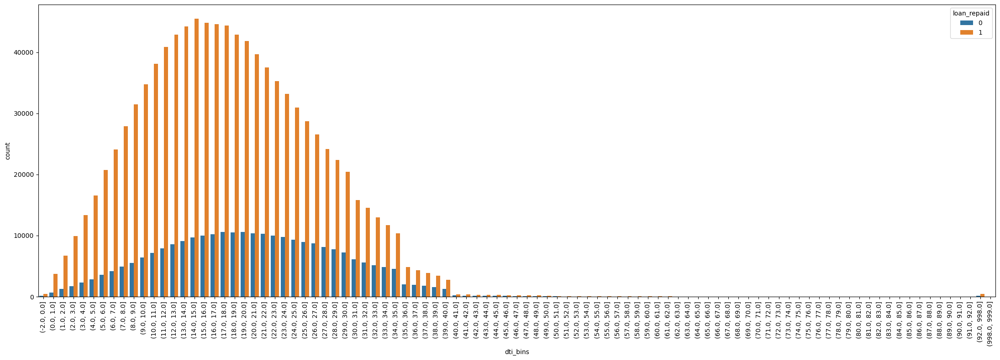

In [62]:
plt.figure(figsize=(22, 8))
g = sns.countplot(data=df_c2, x='dti_bins', hue='loan_repaid')
g.set_xticklabels(g.get_xticklabels(), rotation=90)
plt.tight_layout()
warnings.simplefilter('once')

In [63]:
pd.DataFrame(df_c2['dti'].describe()).T

,count,mean,std,min,25%,50%,75%,max
dti,1262917.0,18.50038,11.309954,-1.0,11.98,17.82,24.34,999.0


From the plot and dataframe above we can see that most of the loans are given for dti ranging [10, 25], but there are some very extreme cases where even though dti was very high loans were approved. From the dataframe below we can see that for those extreme cases charged off / fully paid ratio is less than some comparatively very low dti. 

In [64]:
co_vs_fp = pd.DataFrame(df_c2.groupby(by='dti_bins')['loan_repaid'].value_counts())
co_vs_fp = co_vs_fp.unstack()
co_vs_fp['per_co_to_fp'] = co_vs_fp['count', 0] / co_vs_fp['count', 1]
co_vs_fp.T

C:\Users\sudhn\AppData\Local\Temp\ipykernel_18052\3120676680.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  co_vs_fp = pd.DataFrame(df_c2.groupby(by='dti_bins')['loan_repaid'].value_counts())


dti_bins                  (-2.0, 0.0]   (0.0, 1.0]   (1.0, 2.0]   (2.0, 3.0]  \
             loan_repaid                                                       
count        0               120.0000   708.000000  1297.000000  1693.000000   
             1               437.0000  3745.000000  6721.000000  9943.000000   
per_co_to_fp                   0.2746     0.189052     0.192977     0.170271   

dti_bins                    (3.0, 4.0]    (4.0, 5.0]    (5.0, 6.0]  \
             loan_repaid                                             
count        0             2291.000000   2814.000000   3615.000000   
             1            13329.000000  16565.000000  20755.000000   
per_co_to_fp                  0.171881      0.169876      0.174175   

dti_bins                    (6.0, 7.0]    (7.0, 8.0]    (8.0, 9.0]  \
             loan_repaid                                             
count        0             4159.000000   4928.000000   5543.000000   
             1            24105.000000  27905.000000  31457.000000   
per_co_to_fp                  0.172537      0.176599      0.176209   

dti_bins                   (9.0, 10.0]  (10.0, 11.0]  (11.0, 12.0]  \
             loan_repaid                                             
count        0             6399.000000   7134.000000   7923.000000   
             1            34770.000000  38110.000000  40830.000000   
per_co_to_fp                  0.184038      0.187195      0.194048   

dti_bins                  (12.0, 13.0]  (13.0, 14.0]  (14.0, 15.0]  \
             loan_repaid                                             
count        0             8569.000000   9088.000000   9667.000000   
             1            42873.000000  44201.000000  45523.000000   
per_co_to_fp                  0.199869      0.205606      0.212354   

dti_bins                  (15.0, 16.0]  (16.0, 17.0]  (17.0, 18.0]  \
             loan_repaid                                             
count        0             9995.000000  10199.000000  10558.000000   
             1            44823.000000  44591.000000  44356.000000   
per_co_to_fp                  0.222988      0.228723      0.238029   

dti_bins                  (18.0, 19.0]  (19.0, 20.0]  (20.0, 21.0]  \
             loan_repaid                                             
count        0            10516.000000  10582.000000  10336.000000   
             1            42875.000000  41800.000000  39703.000000   
per_co_to_fp                  0.245271      0.253158      0.260333   

dti_bins                  (21.0, 22.0]  (22.0, 23.0]  (23.0, 24.0]  \
             loan_repaid                                             
count        0            10259.000000   9974.000000   9771.000000   
             1            37474.000000  35271.000000  33172.000000   
per_co_to_fp                  0.273763      0.282782      0.294556   

dti_bins                  (24.0, 25.0]  (25.0, 26.0]  (26.0, 27.0]  \
             loan_repaid                                             
count        0             9310.000000   8983.000000   8722.000000   
             1            30942.000000  28690.000000  26523.000000   
per_co_to_fp                  0.300886      0.313106      0.328847   

dti_bins                  (27.0, 28.0]  (28.0, 29.0]  (29.0, 30.0]  \
             loan_repaid                                             
count        0             8160.000000   7734.000000   7215.000000   
             1            24185.000000  22382.000000  20452.000000   
per_co_to_fp                  0.337399      0.345546      0.352777   

dti_bins                  (30.0, 31.0]  (31.0, 32.0]  (32.0, 33.0]  \
             loan_repaid                                             
count        0             6095.000000   5594.000000    5187.00000   
             1            15799.000000  14553.000000   13016.00000   
per_co_to_fp                  0.385784      0.384388       0.39851   

dti_bins                  (33.0, 34.0]  (34.0, 35.0]  (35.0, 36.0]  \
             loan_r

____
#### 'pct_tl_nvr_dlq'
- Percent of trade never delinquent.

C:\Users\sudhn\AppData\Local\Temp\ipykernel_18052\4100877660.py:3: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  g.set_xticklabels(g.get_xticklabels(), rotation=90)


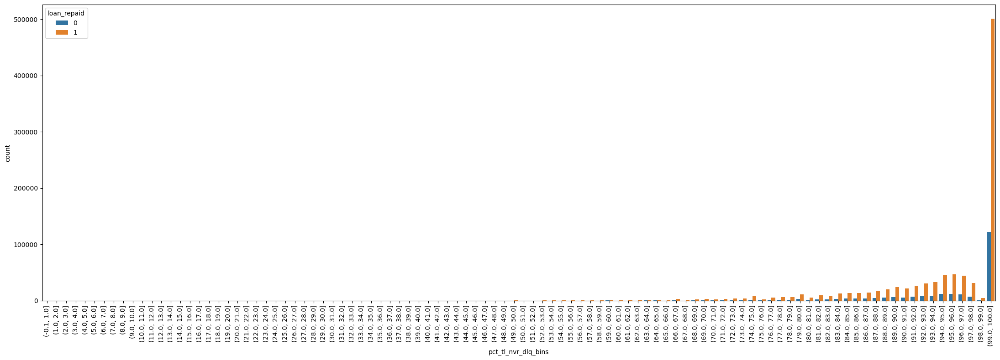

In [65]:
plt.figure(figsize=(22, 8))
g = sns.countplot(data=df_c2, x='pct_tl_nvr_dlq_bins', hue='loan_repaid')
g.set_xticklabels(g.get_xticklabels(), rotation=90)
plt.tight_layout()
warnings.simplefilter('once')

Being delinquent refers to the state of being past due on a debt.

From this plot it can be seen that most of the loans approved are to the borrowers having 75% to 100% of trades never delinquent.
___
## Observations from Univariate Analysis of non categorical features.
1. loan amount : Hike in percentage of charged off cases can be seen in amount interval (8479, 35191).
2. Interest rate : As interest rate increases chances of borrower will default increases.
3. Installment amount : As installment amount increases number of loans approved decreases, also mostly across all bins of installment amount ratio of charged off / fully paid is similar but for some extreme installment amounts it shows a comparatively huge surge.
4. Number of credit lines : most of the borrowers have 5 to 15 credit lines. 
5. Number of currently active revolving trades : Most of the borrowers have 1 to 10 active revolving trades.
Charged off / fully paid ratio also seems quite similar across bins (1, 10), but as number of trades increases this ratio also increases.
6. Number of satisfactory bankcard accounts : Most of the borrowers have 2 to 6 satisfactory bankcard accounts.
7. Debt to income ratio : After dti 15, as dti increases number loans approved decreases.
8. Percent of trade never delinquent : Most of the loans approved are to the borrowers having 75% to 100% of trades never delinquent.
___
### Categorical Features
#### 'term'

In [66]:
final_categorical_features

['mort_acc',
 'verification_status',
 'term',
 'loan_repaid',
 'purpose',
 'home_ownership',
 'sub_grade',
 'addr_state']

<Axes: xlabel='term', ylabel='count'>

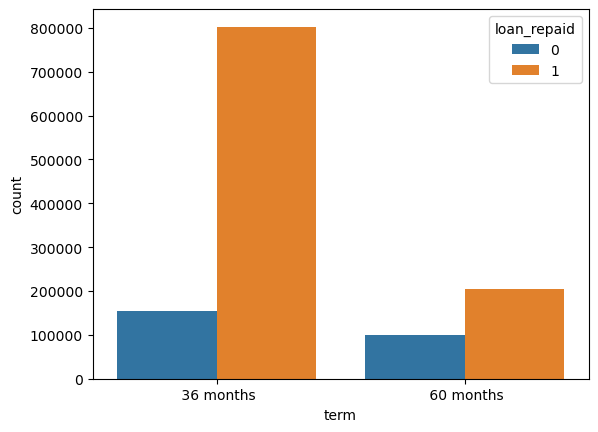

In [67]:
sns.countplot(data=df, x='term', hue='loan_repaid')

Observing the plot it can be seen that number of borrowers in 60 months term category is less than 36 months term category.

The ratio of charged off to fully paid in 60 months category is almost double to the 36 months category.
___
#### 'verification_status'

We have enumerated all the categorical features while calculating mutual inforamtion score, but we have our original dataframe. So from here we are going to use our original dataframe.

In [68]:
df['verification_status'].value_counts()

verification_status
Source Verified    497862
Verified           390418
Not Verified       374637
Name: count, dtype: int64

<Axes: xlabel='verification_status', ylabel='count'>

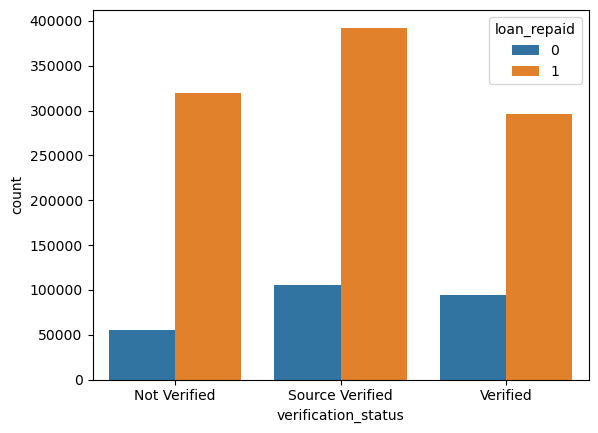

In [69]:
sns.countplot(data=df, x='verification_status', hue='loan_repaid')

C:\Users\sudhn\AppData\Local\Temp\ipykernel_18052\3077684680.py:6: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  g.set_xticklabels(g.get_xticklabels(), rotation=90)


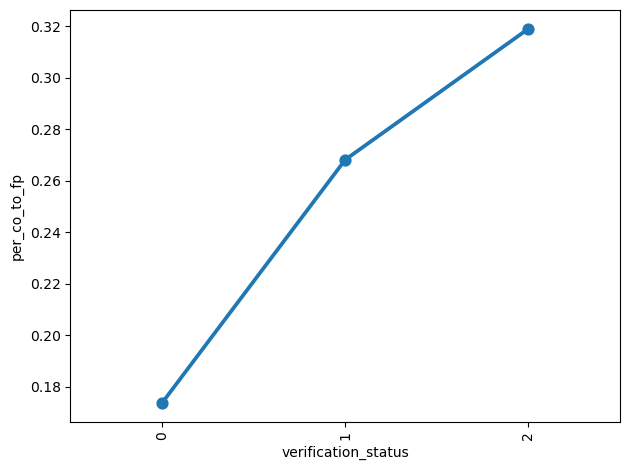

In [70]:
co_vs_fp = pd.DataFrame(df_c2.groupby(by='verification_status')['loan_repaid'].value_counts())
co_vs_fp = co_vs_fp.unstack()
co_vs_fp['per_co_to_fp'] = co_vs_fp['count', 0] / co_vs_fp['count', 1]

g = sns.pointplot(co_vs_fp['per_co_to_fp'])
g.set_xticklabels(g.get_xticklabels(), rotation=90)
plt.tight_layout()
warnings.simplefilter('once')

It can be observed that verified borrowers default more compared to not verified or source verified resources.
___
#### 'mort_acc'
- Number of mortgage accounts.

In [71]:
pd.DataFrame(df['mort_acc'].value_counts()).T

mort_acc,2,1,3,0,4,5,6
count,492859,442975,224660,102328,87,7,1


For 5 and 6 the instances are so rare that we can merge them into 4.

In [72]:
df['mort_acc'] = df['mort_acc'].replace([5, 6], 4)
pd.DataFrame(df['mort_acc'].value_counts()).T

mort_acc,2,1,3,0,4
count,492859,442975,224660,102328,95


<Axes: xlabel='mort_acc', ylabel='count'>

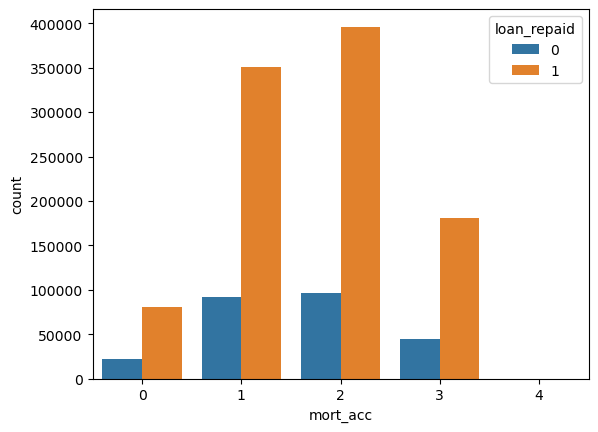

In [73]:
sns.countplot(data=df, x='mort_acc', hue='loan_repaid')

From the plot it can be observed that loans are approved if the number of mortgage accounts is 1 or 2, as number of mortgage accounts increases number of loans approved decreases.
___
'home_ownership'

In [74]:
pd.DataFrame(df['home_ownership'].value_counts()).T

home_ownership,MORTGAGE,RENT,OWN,ANY,NONE,OTHER
count,627898,496833,137820,278,44,44


club 'any', 'none', and 'other' together as 'other'

In [75]:
df['home_ownership'] = df['home_ownership'].replace(['NONE', 'ANY'], 'OTHER')

<Axes: xlabel='home_ownership', ylabel='count'>

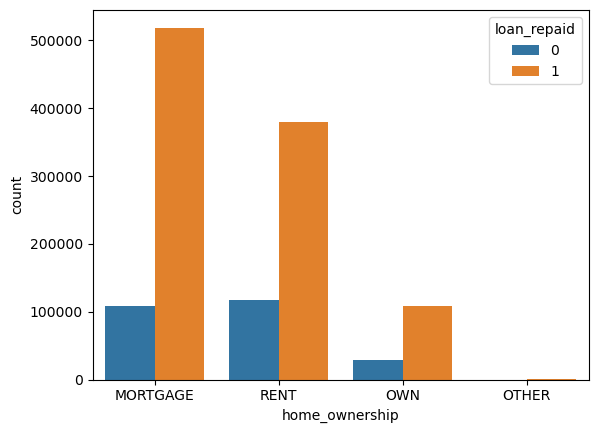

In [76]:
sns.countplot(data=df, x='home_ownership', hue='loan_repaid')

It can be observed that more loans are taken by borrowers who are either living in a rented house of
house with a mortgage. Whereas, there are only a few borrowers who mentioned their house ownership as OTHER.

C:\Users\sudhn\AppData\Local\Temp\ipykernel_18052\4215505931.py:6: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  g.set_xticklabels(g.get_xticklabels(), rotation=90)


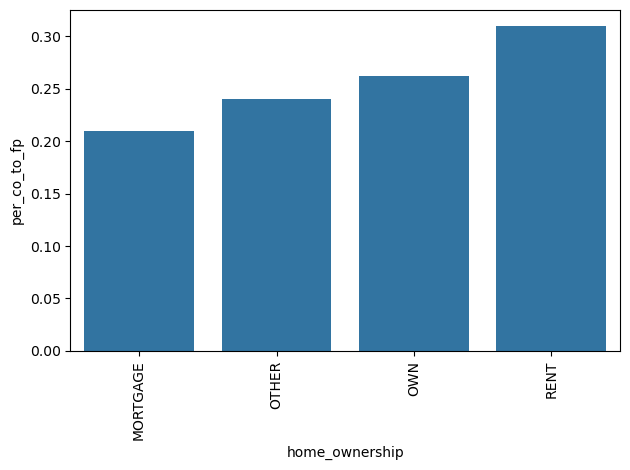

In [77]:
co_vs_fp = pd.DataFrame(df.groupby(by='home_ownership')['loan_repaid'].value_counts())
co_vs_fp = co_vs_fp.unstack()
co_vs_fp['per_co_to_fp'] = co_vs_fp['count', 0] / co_vs_fp['count', 1]

g = sns.barplot(co_vs_fp['per_co_to_fp'])
g.set_xticklabels(g.get_xticklabels(), rotation=90)
plt.tight_layout()
warnings.simplefilter('once')

borrowers who mention 'other' as their home ownership have higher number of charge offs
compared to others even though the number of borrowers who mentioned 'other' as their home ownership are less.
___
#### 'purpose'


In [78]:
pd.DataFrame(df['purpose'].value_counts()).T

purpose,debt_consolidation,credit_card,home_improvement,other,major_purchase,medical,small_business,car,moving,vacation,house,wedding,renewable_energy,educational
count,738380,283417,81265,70245,25937,14183,12429,12258,8436,8256,6474,862,774,1


C:\Users\sudhn\AppData\Local\Temp\ipykernel_18052\1157087723.py:3: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  g.set_xticklabels(g.get_xticklabels(), rotation=90)


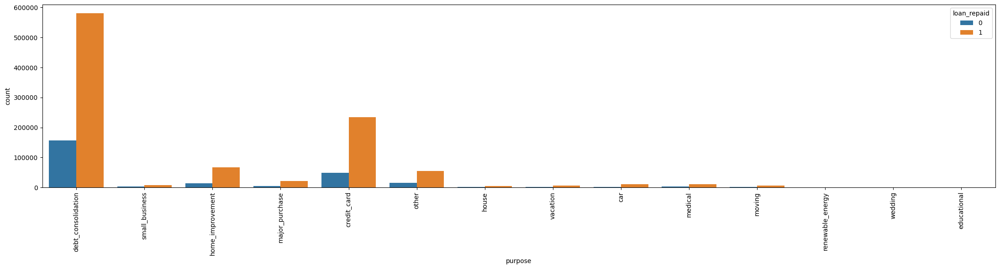

In [79]:
plt.figure(figsize=(22, 6))
g = sns.countplot(data=df, x='purpose', hue='loan_repaid')
g.set_xticklabels(g.get_xticklabels(), rotation=90)
plt.tight_layout()
warnings.simplefilter('once')

It can be observed that very high number of loans are given for the purpose of debt consolidation.

C:\Users\sudhn\AppData\Local\Temp\ipykernel_18052\3123198519.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  g.set_xticklabels(g.get_xticklabels(), rotation=90)


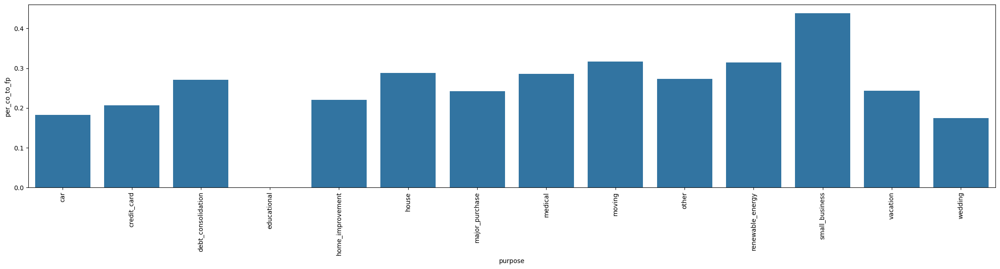

In [80]:
co_vs_fp = pd.DataFrame(df.groupby(by='purpose')['loan_repaid'].value_counts())
co_vs_fp = co_vs_fp.unstack()
co_vs_fp['per_co_to_fp'] = co_vs_fp['count', 0] / co_vs_fp['count', 1]

plt.figure(figsize=(22, 6))
g = sns.barplot(co_vs_fp['per_co_to_fp'])
g.set_xticklabels(g.get_xticklabels(), rotation=90)
plt.tight_layout()
warnings.simplefilter('once')

It can be observed that all the purposes have almost same amount of percentage charge off. However,
'small_business' purpose has significantly high amount of charge off. which means if a borrower is taking
loan to start his/her small business and if it doesn't work out, they default on the loan.
___
#### 'sub_grade'

In [81]:
pd.DataFrame(df['sub_grade'].value_counts()).T

sub_grade,C1,B4,B5,B3,C2,C3,C4,B2,B1,C5,A5,D1,A4,D2,A1,D3,A3,A2,D4,D5,E1,E2,E3,E4,E5,F1,F2,F3,F4,F5,G1,G2,G3,G4,G5
count,80541,78017,77159,75476,74605,71820,71518,69769,67368,64775,59351,48920,47080,41951,41339,36758,34877,34387,33369,27987,22217,20001,17215,14675,13512,9274,6651,5672,4518,3646,2758,1970,1515,1181,1045


C:\Users\sudhn\AppData\Local\Temp\ipykernel_18052\1801320836.py:4: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  g.set_xticklabels(g.get_xticklabels(), rotation=90)


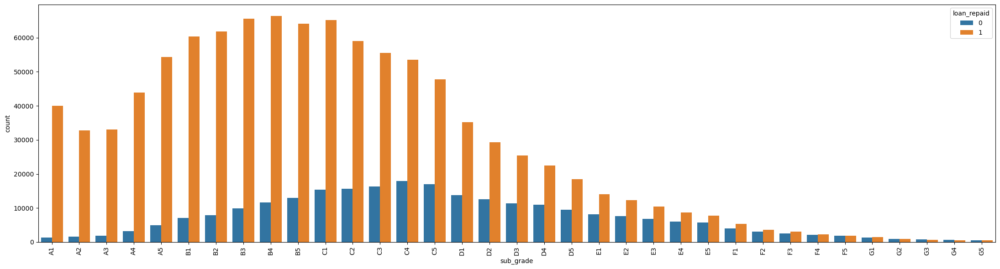

In [82]:
plt.figure(figsize=(22, 6))
subgrade_order = sorted(df['sub_grade'].unique())
g = sns.countplot(data=df, x='sub_grade', hue='loan_repaid', order=subgrade_order)
g.set_xticklabels(g.get_xticklabels(), rotation=90)
plt.tight_layout()
warnings.simplefilter('once')

It can be observed the lesser the grade, more the number of loans. Lesser grade is considered as good as the
borrower may have a good credit history. As the grade increases, the interest rate will also increase.

Also it can be observed that higher the grade, higher the ratio of charged off / fully paid.
Hence, it is safe to assume that if the grade calculated for a loan is higher, 
the borrower is more likely to default.
___
#### 'addr_state'

In [83]:
pd.DataFrame(df['addr_state'].value_counts()).T

addr_state,CA,TX,NY,FL,IL,NJ,PA,OH,GA,NC,VA,MI,AZ,MD,MA,CO,WA,MN,IN,TN,MO,NV,CT,WI,AL,OR,SC,LA,KY,OK,KS,AR,UT,NM,MS,HI,NH,RI,WV,MT,DE,NE,DC,AK,WY,SD,VT,ME,ID,ND,IA
count,182548,104062,102366,89674,48751,45193,42552,41359,40664,35650,35147,33403,30858,29172,28722,28075,27212,22645,21462,20084,19935,19239,18359,16705,15537,15436,14950,14472,12106,11583,10533,9448,9308,6925,6453,6332,6103,5511,4550,3605,3543,3527,3119,2967,2734,2606,2494,2002,1648,1587,1


Even though it is a categorical variable, it has too many categories in case if we choose to convert this variable into dummy variables. Hence we will group these states based on their region and then remove this feature.

For this we will use this dataset https://www.kaggle.com/datasets/omer2040/usa-states-to-region.

In [84]:
states_df = pd.read_csv('states.csv')
state_dict = states_df[['State Code', 'Region']].to_dict('split')
state_dict = dict(state_dict['data'])
df['addr_state'] = df['addr_state'].map(state_dict)
df.rename(columns={'addr_state' : 'region'}, inplace=True)
df['region'].value_counts()

region
South        450214
West         336887
Northeast    253302
Midwest      222514
Name: count, dtype: int64

In [85]:
# we can not implement the following code as we have encoded the categorical features into numeric codes at the very  begining of the EDA.
# df_c['addr_state'] = df_c['addr_state'].map(state_dict)
# df_c.rename(columns={'addr_state' : 'region'}, inplace=True)

# df_c2['addr_state'] = df_c2['addr_state'].map(state_dict)
# df_c2.rename(columns={'addr_state' : 'region'}, inplace=True)

In [86]:
pd.DataFrame(df['region'].value_counts()).T

region,South,West,Northeast,Midwest
count,450214,336887,253302,222514


<Axes: xlabel='region', ylabel='count'>

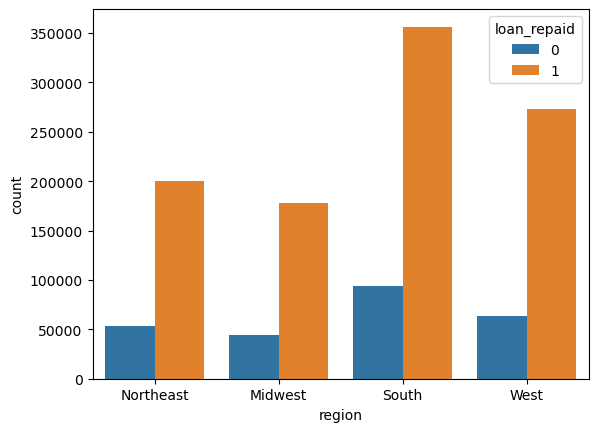

In [87]:
sns.countplot(data=df, x='region', hue='loan_repaid')

From the plot it can be seen South region contains most borrowers.

C:\Users\sudhn\AppData\Local\Temp\ipykernel_18052\615091423.py:6: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  g.set_xticklabels(g.get_xticklabels(), rotation=90)


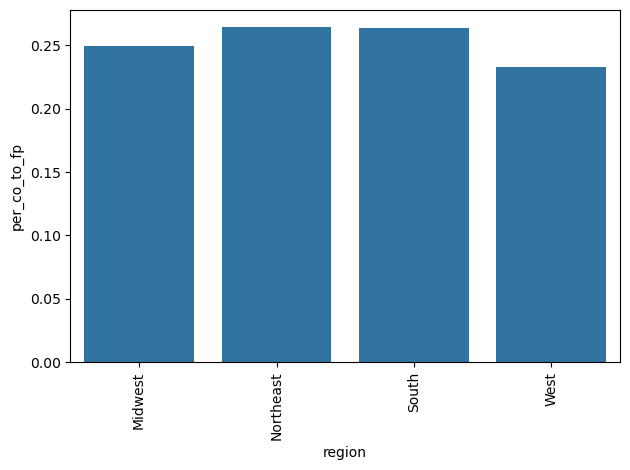

In [88]:
co_vs_fp = pd.DataFrame(df.groupby(by='region')['loan_repaid'].value_counts())
co_vs_fp = co_vs_fp.unstack()
co_vs_fp['per_co_to_fp'] = co_vs_fp['count', 0] / co_vs_fp['count', 1]

g = sns.barplot(co_vs_fp['per_co_to_fp'])
g.set_xticklabels(g.get_xticklabels(), rotation=90)
plt.tight_layout()
warnings.simplefilter('once')

After South, West region contains most number of borrowers, though West has least charged off / fully paid percentage.
___
## Observations from Univariate Analysis of categorical features.
1. Term : number of borrowers in 60 months term category is less than 36 months term category. The ratio of charged off to fully paid in 60 months category is almost double to the 36 months category.
2. Verification status : Verified borrowers default more compared to not verified or source verified resources.
3. Number mortgage accounts : Most of loans are approved if the number of mortgage accounts is 1 or 2, as number of mortgage accounts increases number of loans approved decreases.
4. Home ownership : If the borrower lives in a rented house or "other" house, chances of default increases.
5. Purpose : If the purpose of loan is a small business/risky business, chances of default increases.
6. Sub grade : As the grade increases, the interest rate will also increase.
7. Region : Most of the borrowers are from South region.
___
### Bivariate Analysis and Multivariate Analysis.

#### numeric - numeric variable analysis.

In [89]:
final_non_categorical_features.append('loan_repaid')

In [90]:
final_categorical_features.remove('addr_state')
final_categorical_features.append('region')
final_features.remove('addr_state')
final_features.append('region')

In [91]:
df[final_non_categorical_features].drop(axis=1, columns=['id']).corr().style.background_gradient()

,pct_tl_nvr_dlq,dti,num_actv_rev_tl,open_acc,int_rate,num_bc_sats,loan_amnt,loan_repaid
pct_tl_nvr_dlq,1.000000,0.072928,0.106991,0.107364,-0.062861,0.133597,0.089222,0.010579
dti,0.072928,1.000000,0.223593,0.217618,0.145583,0.079919,0.025632,-0.083524
num_actv_rev_tl,0.106991,0.223593,1.000000,0.987783,-0.008380,0.610304,0.184648,-0.027202
open_acc,0.107364,0.217618,0.987783,1.000000,-0.007323,0.615952,0.180932,-0.027475
int_rate,-0.062861,0.145583,-0.008380,-0.007323,1.000000,-0.050944,0.133332,-0.260590
num_bc_sats,0.133597,0.079919,0.610304,0.615952,-0.050944,1.000000,0.212996,-0.014864
loan_amnt,0.089222,0.025632,0.184648,0.180932,0.133332,0.212996,1.000000,-0.063642
loan_repaid,0.010579,-0.083524,-0.027202,-0.027475,-0.260590,-0.014864,-0.063642,1.000000


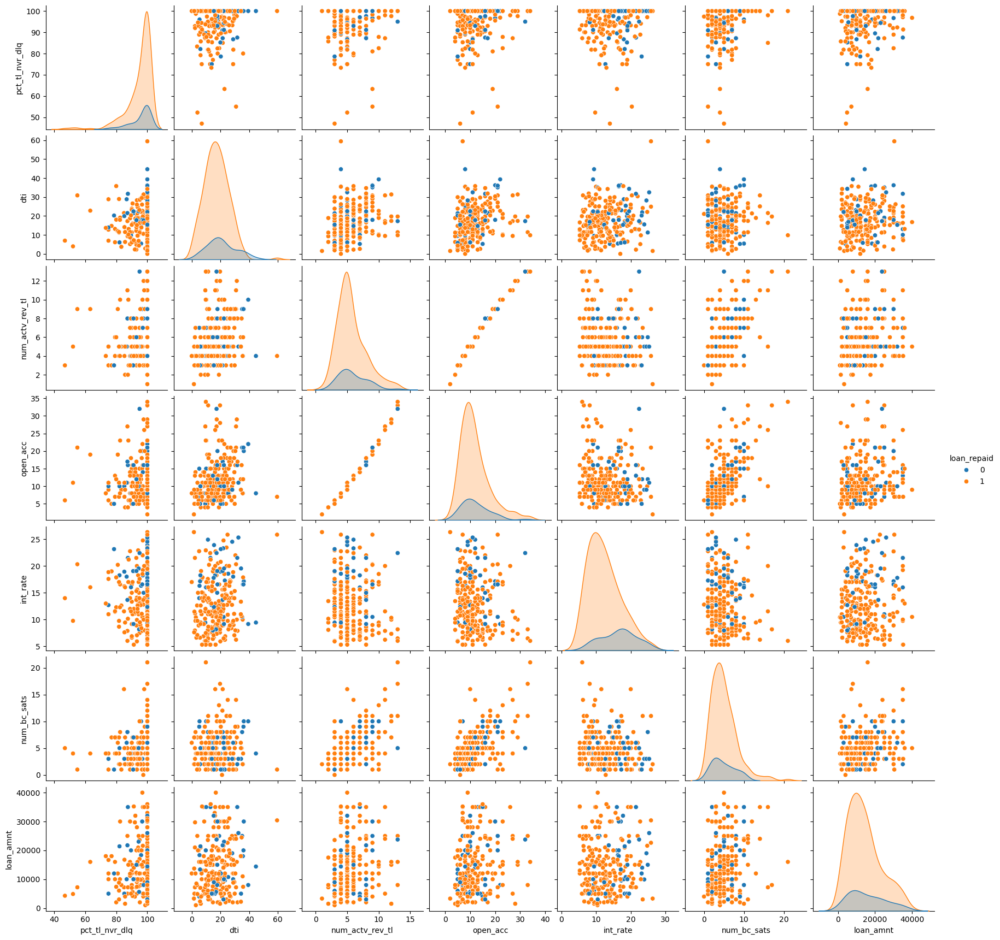

In [92]:
sns.pairplot(sample_df[final_non_categorical_features].drop(axis=1, columns=['id']), hue='loan_repaid')

___
#### numerical - categorical variable analysis

In [93]:
final_categorical_features

['mort_acc',
 'verification_status',
 'term',
 'loan_repaid',
 'purpose',
 'home_ownership',
 'sub_grade',
 'region']

<Axes: xlabel='mort_acc', ylabel='open_acc'>

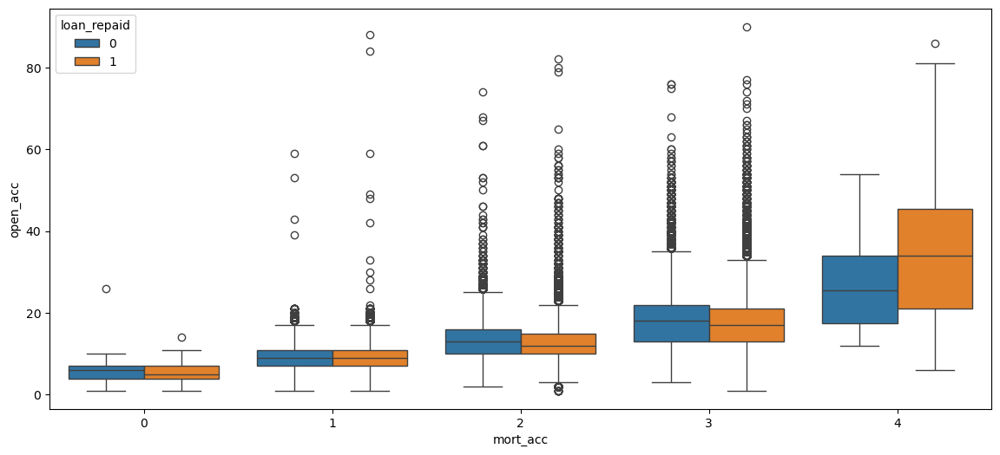

In [94]:
# open_acc vs mort_acc
plt.figure(figsize=(14, 6))
sns.boxplot(data=df, x='mort_acc', y='open_acc', hue='loan_repaid')

As the number of mortgage accounts increases number of open credit lines increases and number of outliers decreases.
___

At very beginning of EDA, we have encoded the categorical features with numeric values, so to conduct further bivariate analysis we need to concatenate binned variables with original non encoded categorical features.

In [95]:
df_c3 = pd.concat([df[final_categorical_features], df_c2[list(set(mi_score_df.T.columns)-set(final_categorical_features))]], axis=1)

C:\Users\sudhn\AppData\Local\Temp\ipykernel_18052\2595904943.py:9: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  g.set_xticklabels(g.get_xticklabels(), rotation=90)
C:\Users\sudhn\AppData\Local\Temp\ipykernel_18052\2595904943.py:9: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  g.set_xticklabels(g.get_xticklabels(), rotation=90)
C:\Users\sudhn\AppData\Local\Temp\ipykernel_18052\2595904943.py:9: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  g.set_xticklabels(g.get_xticklabels(), rotation=90)
C:\Users\sudhn\AppData\Local\Temp\ipykernel_18052\2595904943.py:9: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  g.set_xticklabels(g.get_xticklabels(), rotation=90)


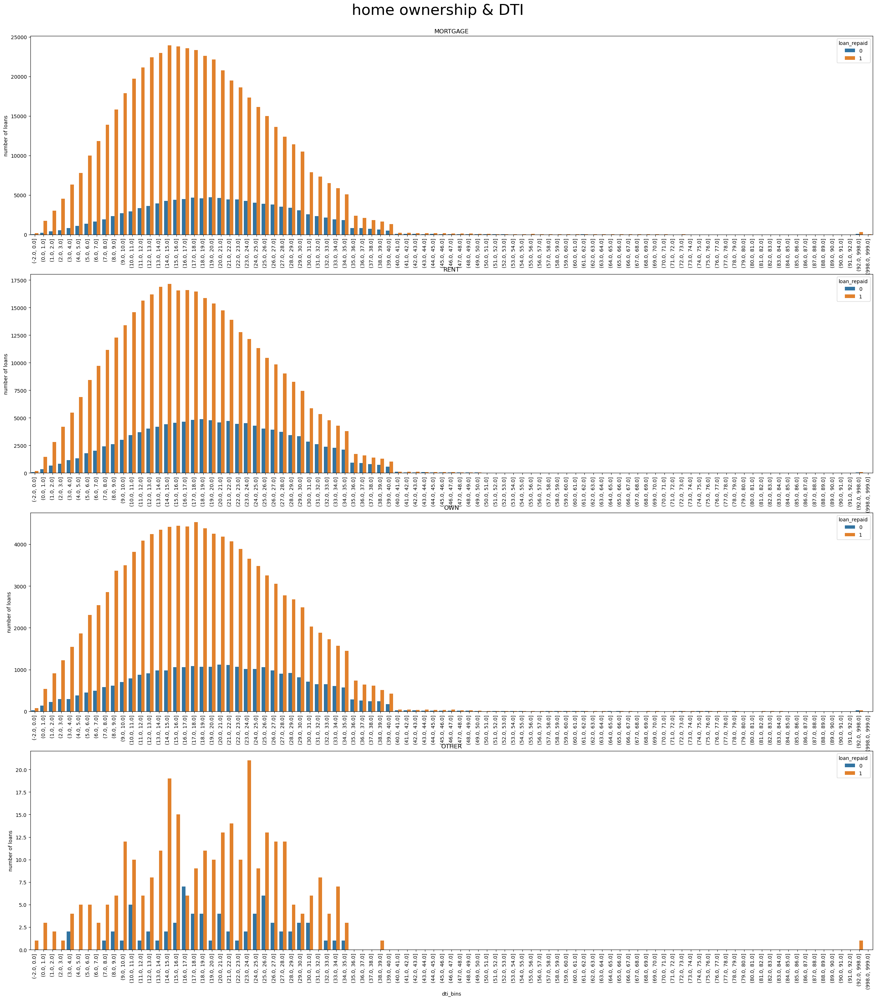

In [138]:
# home_ownership & dti
fig, axs = plt.subplots(4, 1, figsize = (30, 30))
# axs.flatten()
fig.suptitle('home ownership & DTI', fontsize = 30)
i = 0

for ownership_status in list(df_c3['home_ownership'].unique()):
    g = sns.countplot(ax=axs[i], data=df_c3[df_c3['home_ownership'] == ownership_status], x='dti_bins', hue='loan_repaid')
    g.set_xticklabels(g.get_xticklabels(), rotation=90)
    axs[i].set_ylabel('number of loans')
    axs[i].set_title(ownership_status)
    i = i + 1

plt.subplots_adjust(top = 0.95, wspace=0.15)
plt.show()

# Note : Y axis is not shared.

When we consider the different combinations of variables home_ownership and dti_bin, we could observe that, providing loans for home ownership value "other" is risky as the distribution is quite random.
___

C:\Users\sudhn\AppData\Local\Temp\ipykernel_18052\2377165110.py:10: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  g.set_xticklabels(g.get_xticklabels(), rotation=60)
C:\Users\sudhn\AppData\Local\Temp\ipykernel_18052\2377165110.py:10: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  g.set_xticklabels(g.get_xticklabels(), rotation=60)


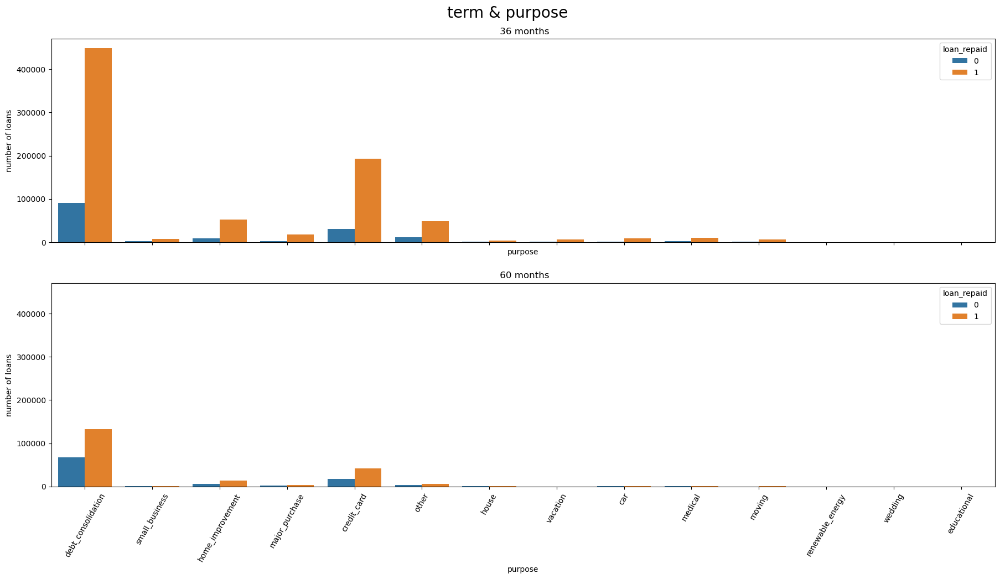

In [145]:
# term & purpose
fig, axs = plt.subplots(2, 1, figsize = (22, 10), sharey=True)
# axs.flatten()
fig.suptitle('term & purpose', fontsize = 20)
i = 0
p_order = list(df_c3['purpose'].unique())

for t in list(df_c3['term'].unique()):
    g = sns.countplot(ax=axs[i], data=df_c3[df_c3['term'] == t], x='purpose', hue='loan_repaid', order=p_order)
    g.set_xticklabels(g.get_xticklabels(), rotation=60)
    axs[i].set_ylabel('number of loans')
    axs[i].set_title(t)
    i = i + 1

plt.setp(axs[0].get_xticklabels(), visible=False)
plt.subplots_adjust(top = 0.92, wspace=0.15)
plt.show()


Here we have shared Y axis, so we can clearly see that the number of loans for 60 months term across all purposes are less than 36 months term.

Therefore Comparing the charged off percentage.

In [143]:
co_vs_fp = pd.DataFrame(df.groupby(by=['term', 'purpose'])['loan_repaid'].value_counts())
co_vs_fp = co_vs_fp.unstack()
co_vs_fp['per_co_to_fp'] = co_vs_fp['count', 0] / co_vs_fp['count', 1]

C:\Users\sudhn\AppData\Local\Temp\ipykernel_18052\276708412.py:9: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  g.set_xticklabels(g.get_xticklabels(), rotation=60)
C:\Users\sudhn\AppData\Local\Temp\ipykernel_18052\276708412.py:9: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  g.set_xticklabels(g.get_xticklabels(), rotation=60)


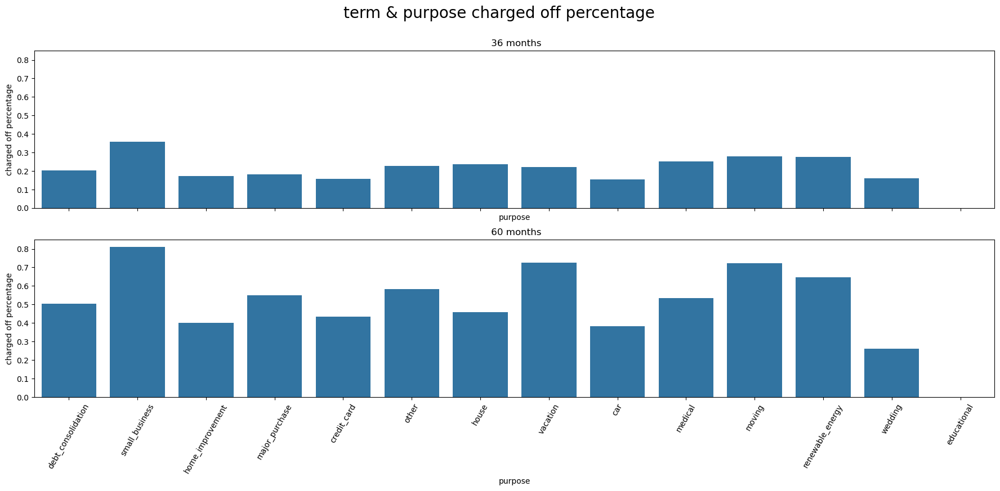

In [146]:
fig, axs = plt.subplots(2, 1, figsize = (22, 8), sharey=True)
# axs.flatten()
fig.suptitle('term & purpose charged off percentage', fontsize = 20)
i = 0
p_order = list(df_c3['purpose'].unique())

for t in co_vs_fp.index.get_level_values(0).unique().to_list():
    g = sns.barplot(ax=axs[i], data=co_vs_fp.loc[t]['per_co_to_fp'], order=p_order)
    g.set_xticklabels(g.get_xticklabels(), rotation=60)
    axs[i].set_ylabel('charged off percentage')
    axs[i].set_title(t)
    i = i + 1

plt.setp(axs[0].get_xticklabels(), visible=False)
# plt.subplots_adjust(top = 0.92, wspace=0.15)
plt.show()

 We can observe that providing loans for debt consolidation, educational for long term, small business for long term, credit card for long term, "other"  for long term are high risk combinations.
 ___
## Observation from Bivariate analysis.
1. Providing loans for home ownership value "other" is risky.
2. Providing loans for debt consolidation, educational for long term, small business for long term, credit card for long term, "other"  for long term are high risky
___


In [153]:
df[final_features].to_csv('cleaned_and_reduced.csv', index=False)